# Custom OCR - text recognition

# Importing the libraries

In [1]:
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
import imutils
from google.colab.patches import cv2_imshow

# Loading the neural network

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
network = load_model('/content/drive/MyDrive/Cursos - recursos/OCR with Python/Models/network.keras')
network.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 2, 2, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 36)             │         4,644 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 415,406 (1.58 MB)

 Trainable params: 138,468 (540.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 276,938 (1.06 MB)

# Loading the test image

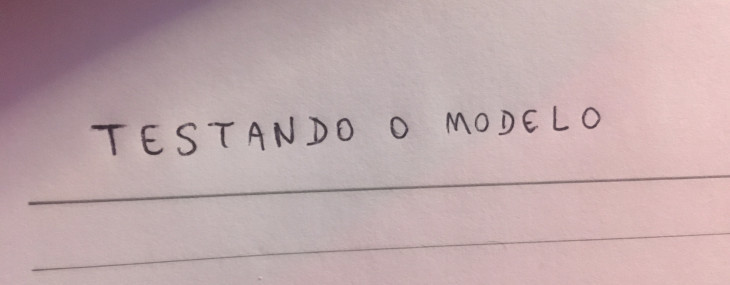

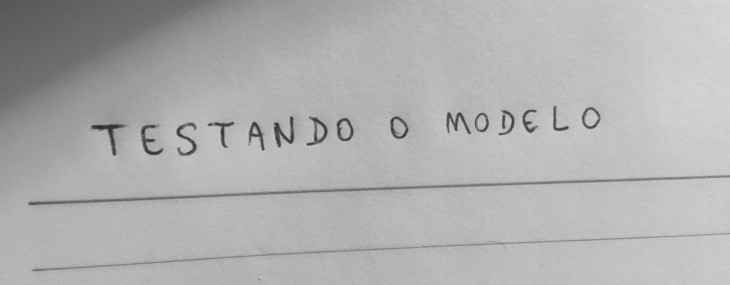

In [11]:
img = cv2.imread('/content/test-manuscript01.jpg')
cv2_imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

# Pre-processing the image

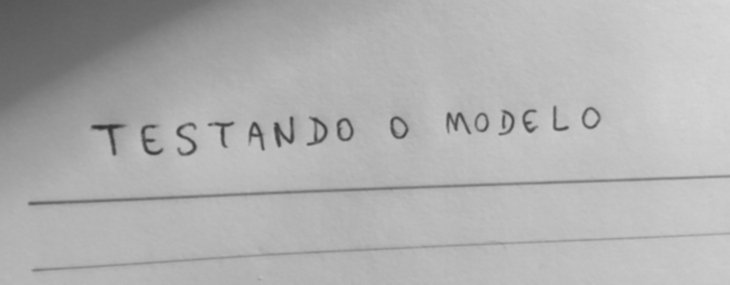

In [12]:
blur = cv2.GaussianBlur(gray, (3,3), 0)
cv2_imshow(blur)

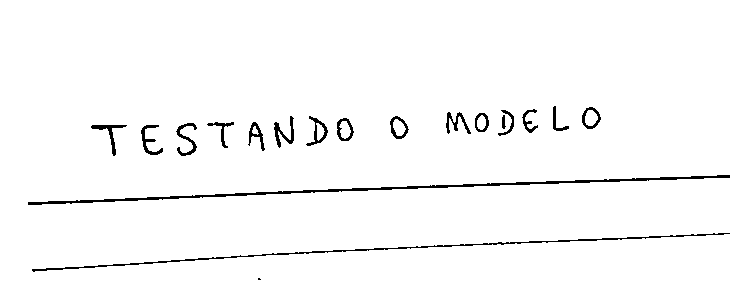

In [13]:
adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
cv2_imshow(adaptive)

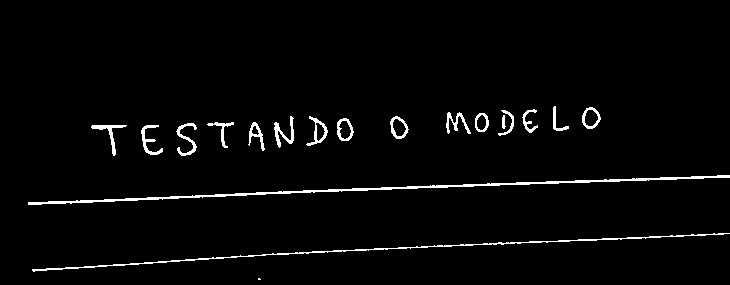

In [14]:
invertion = 255 - adaptive
cv2_imshow(invertion)

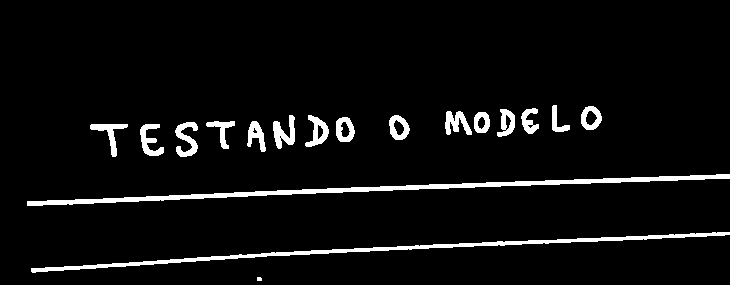

In [15]:
dilation = cv2.dilate(invertion, np.ones((3,3)))
cv2_imshow(dilation)

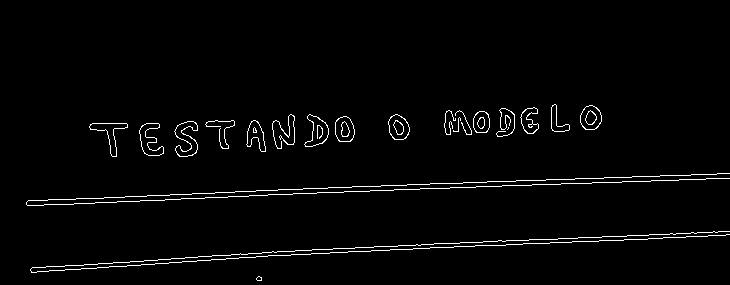

In [16]:
edges = cv2.Canny(dilation, 40, 150)
cv2_imshow(edges)

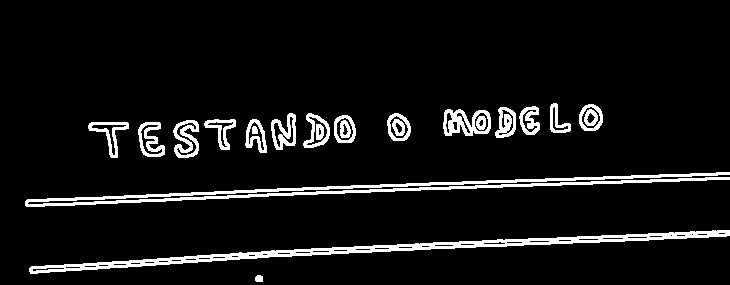

In [17]:
dilation = cv2.dilate(edges, np.ones((3,3)))
cv2_imshow(dilation)

# Contour detection

In [18]:
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method = 'left-to-right')[0]
  return conts

In [19]:
conts = find_contours(dilation.copy())

In [20]:
conts

(array([[[716, 172]],
 
        [[715, 173]],
 
        [[690, 173]],
 
        [[689, 174]],
 
        [[659, 174]],
 
        [[658, 175]],
 
        [[631, 175]],
 
        [[630, 176]],
 
        [[603, 176]],
 
        [[602, 177]],
 
        [[574, 177]],
 
        [[573, 178]],
 
        [[545, 178]],
 
        [[544, 179]],
 
        [[515, 179]],
 
        [[514, 180]],
 
        [[486, 180]],
 
        [[485, 181]],
 
        [[462, 181]],
 
        [[461, 182]],
 
        [[429, 182]],
 
        [[428, 183]],
 
        [[406, 183]],
 
        [[405, 184]],
 
        [[380, 184]],
 
        [[379, 185]],
 
        [[351, 185]],
 
        [[350, 186]],
 
        [[327, 186]],
 
        [[326, 187]],
 
        [[302, 187]],
 
        [[301, 188]],
 
        [[277, 188]],
 
        [[276, 189]],
 
        [[255, 189]],
 
        [[254, 190]],
 
        [[234, 190]],
 
        [[233, 191]],
 
        [[214, 191]],
 
        [[213, 192]],
 
        [[191, 192]],
 
        [[190, 1

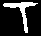

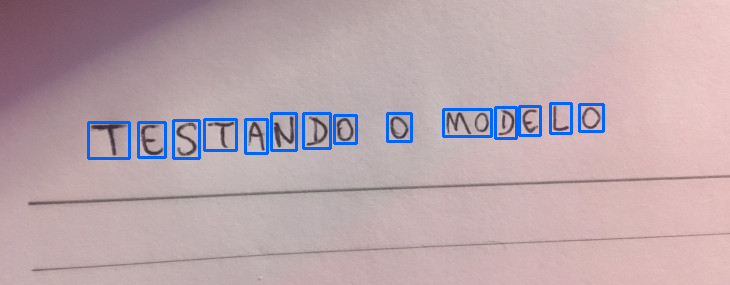

In [21]:
min_w, max_w = 4, 160
min_h, max_h = 14, 140
img_copy = img.copy()
for c in conts:
  #print(c)
  (x, y, w, h) = cv2.boundingRect(c)
  #print(x, y, w, h)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    roi = gray[y:y+h, x:x+w]
    #cv2_imshow(roi)
    thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    cv2_imshow(thresh)
    cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 100, 0), 2)
cv2_imshow(img_copy)

# Processing the detected characters

## ROI extraction


In [22]:
def extract_roi(img):
  roi = img[y:y + h, x:x + w]
  return roi

## Thresholding

In [23]:
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  return thresh

## Resizing

In [24]:
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width = 28)
  else:
    resized = imutils.resize(img, height = 28)

  (h, w) = resized.shape
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value = (0,0,0))
  filled = cv2.resize(filled, (28,28))
  return filled

In [25]:
(x, y, w, h) = cv2.boundingRect(conts[6])
print(x, y, w, h)
test_img = thresholding(gray[y:y+h, x:x+w])
cv2_imshow(test_img)
(h, w) = test_img.shape
print(h, w)
test_img2 = resize_img(test_img, w, h)
cv2_imshow(test_img2)
print(test_img2.shape)

245 119 22 34


34 22


(28, 28)


In [26]:
cv2_imshow(cv2.resize(test_img, (28,28)))

## Normalization

In [27]:
def normalization(img):
  img = img.astype('float32') / 255.0
  img = np.expand_dims(img, axis = -1)
  return img

In [28]:
test_img2.shape, normalization(test_img2).shape

((28, 28), (28, 28, 1))

## Processing the detections

In [29]:
characters = []

In [30]:
def process_box(gray, x, y, w, h):
  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)
  cv2_imshow(resized)
  normalized = normalization(resized)
  characters.append((normalized, (x, y, w, h)))

In [31]:
for c in conts:
  #print(c)
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

In [32]:
characters[0]

(array([[[0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ]],
 
        [[0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
        

In [33]:
boxes = [box[1] for box in characters]
boxes

[(88, 122, 41, 36),
 (138, 122, 27, 35),
 (173, 120, 26, 38),
 (204, 119, 32, 31),
 (245, 119, 22, 34),
 (271, 113, 25, 37),
 (303, 113, 27, 35),
 (334, 115, 22, 28),
 (387, 113, 24, 28),
 (443, 109, 48, 27),
 (495, 107, 21, 31),
 (519, 106, 21, 29),
 (550, 103, 21, 30),
 (579, 104, 24, 27)]

In [34]:
pixels = np.array([pixel[0] for pixel in characters], dtype = 'float32')

In [35]:
pixels

array([[[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]]],


       [[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],

        ...,

        [[0.],
 

# Recognition of characters

In [36]:
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
characters_list = digits + letters
characters_list = [l for l in characters_list]

In [37]:
print(characters_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [38]:
pixels[0].shape

(28, 28, 1)

In [39]:
pixels.shape

(14, 28, 28, 1)

In [40]:
predictions = network.predict(pixels)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


In [41]:
predictions

array([[3.81709740e-14, 2.57512744e-11, 2.58798733e-12, 1.66128862e-12,
        1.52668034e-09, 1.16699678e-10, 3.45033979e-15, 8.27913664e-06,
        3.33516020e-10, 9.47607895e-11, 1.03087934e-10, 5.33198214e-13,
        9.97569249e-10, 1.97144662e-10, 4.00336361e-12, 8.81872214e-11,
        2.77037433e-08, 3.57437829e-11, 1.93251179e-10, 1.92741027e-06,
        2.96744798e-08, 9.69537853e-11, 9.53106517e-13, 1.03631062e-10,
        7.03107628e-10, 3.15829279e-10, 2.04452387e-15, 1.58371441e-11,
        5.61244551e-10, 9.99989331e-01, 2.06898965e-09, 1.68368686e-14,
        2.30868764e-13, 2.77912786e-08, 1.81076288e-07, 2.72306622e-09],
       [1.22814356e-10, 2.93995522e-10, 1.17985075e-11, 3.75296847e-16,
        4.21860498e-11, 8.91385099e-08, 1.42684309e-08, 2.31163626e-14,
        7.65453567e-09, 4.00174338e-11, 1.10988189e-11, 2.34100014e-07,
        4.39499900e-06, 7.31126271e-11, 9.99961555e-01, 3.26975569e-05,
        4.60288703e-07, 4.82527455e-11, 7.47686843e-11, 8.70868

In [42]:
predictions.shape

(14, 36)

In [43]:
boxes

[(88, 122, 41, 36),
 (138, 122, 27, 35),
 (173, 120, 26, 38),
 (204, 119, 32, 31),
 (245, 119, 22, 34),
 (271, 113, 25, 37),
 (303, 113, 27, 35),
 (334, 115, 22, 28),
 (387, 113, 24, 28),
 (443, 109, 48, 27),
 (495, 107, 21, 31),
 (519, 106, 21, 29),
 (550, 103, 21, 30),
 (579, 104, 24, 27)]

T  ->  99.99893


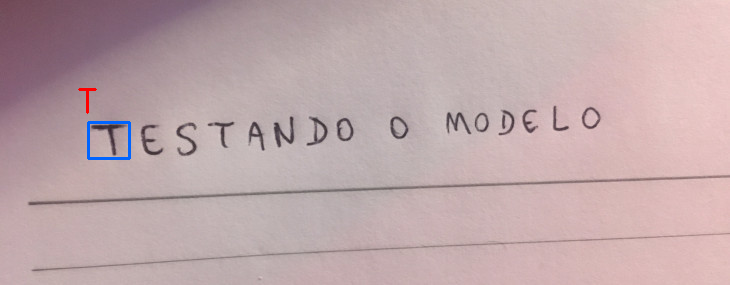

E  ->  99.996155


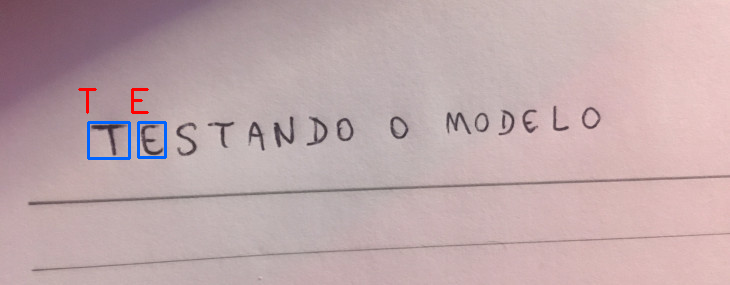

S  ->  94.5655


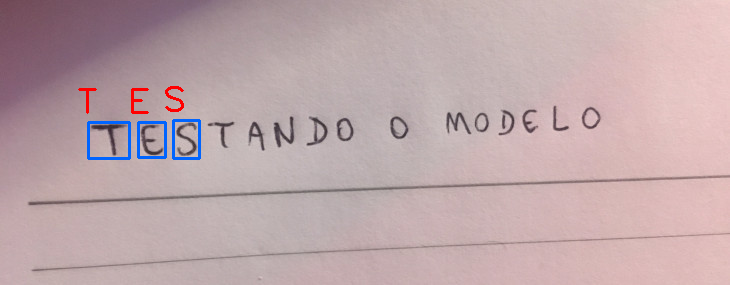

T  ->  99.975845


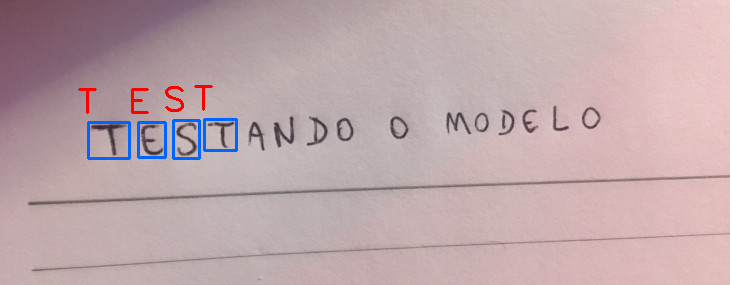

A  ->  99.98797


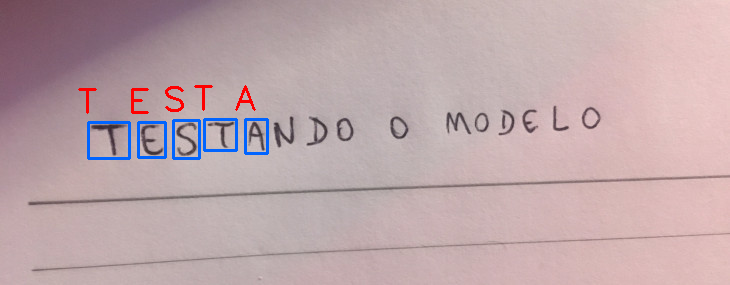

N  ->  99.89003


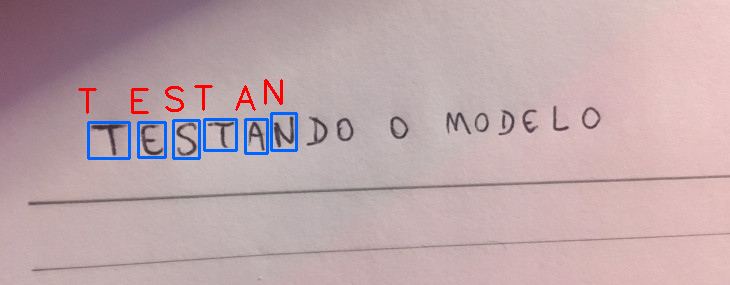

D  ->  99.99948


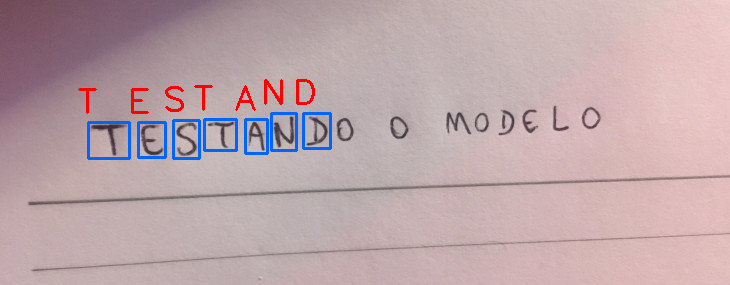

0  ->  70.88409


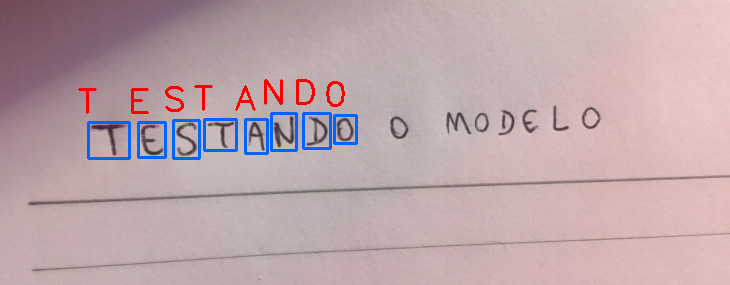

0  ->  69.16576


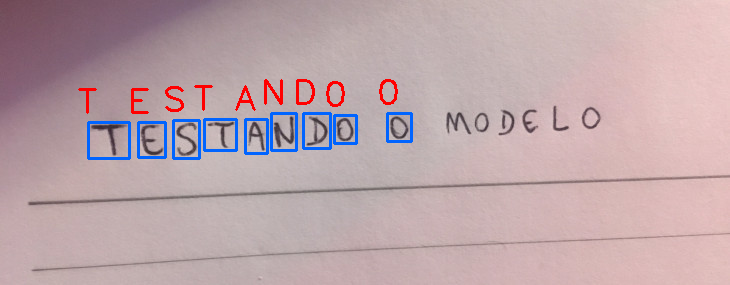

M  ->  99.71148


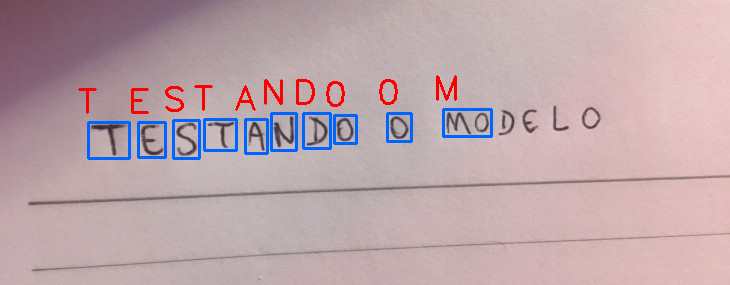

D  ->  99.931


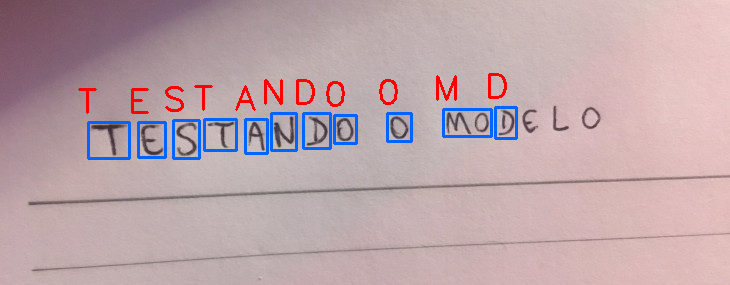

E  ->  99.108246


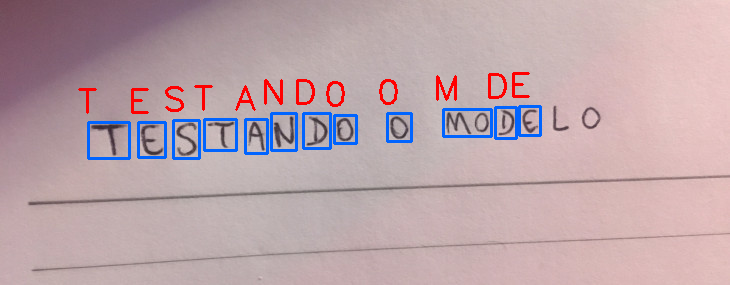

L  ->  99.99442


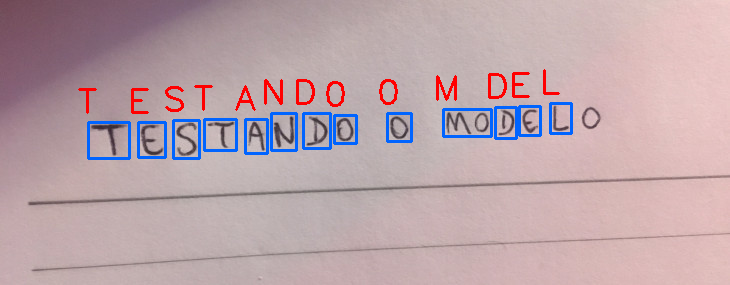

0  ->  96.71218


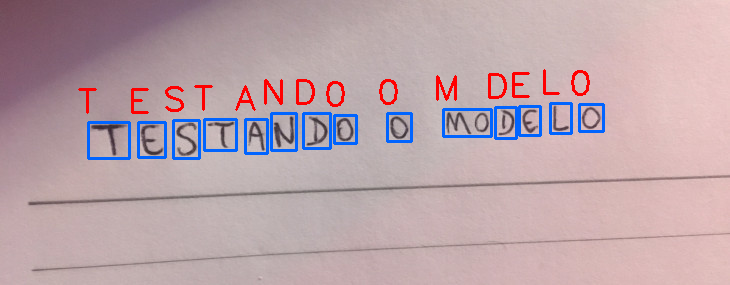

In [44]:
img_copy = img.copy()
for (prediction, (x, y, w, h)) in zip(predictions, boxes):
  i = np.argmax(prediction)
  #print(i)
  probability = prediction[i]
  #print(probability)
  character = characters_list[i]
  #print(character)

  cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255,100,0), 2)
  cv2.putText(img_copy, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0,0,255), 2)
  print(character, ' -> ', probability * 100)

  cv2_imshow(img_copy)

In [45]:
def extract_roi(img, margin=2):
  roi = img[y - margin:y + h, x - margin:x + w + margin]
  return roi

In [46]:
conts = find_contours(dilation.copy())
characters = []
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

In [47]:
boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype='float32')
predictions = network.predict(pixels)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


T  ->  99.973335


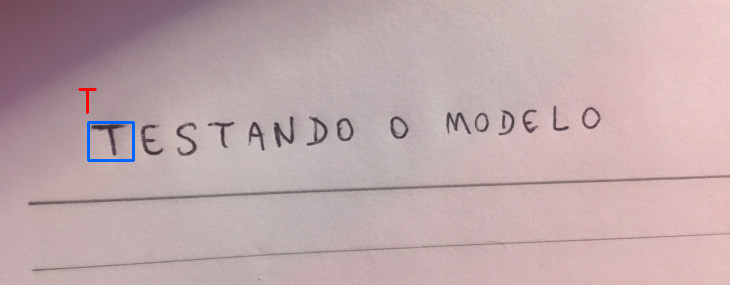

E  ->  99.999886


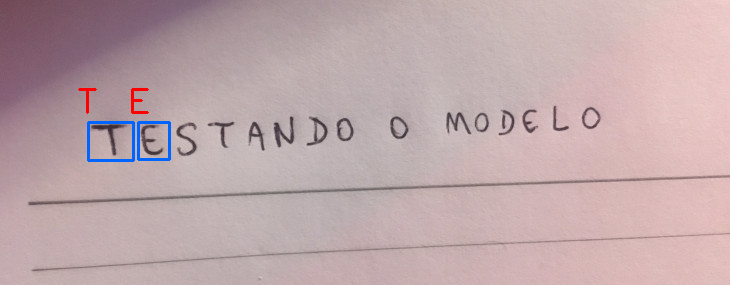

S  ->  91.720985


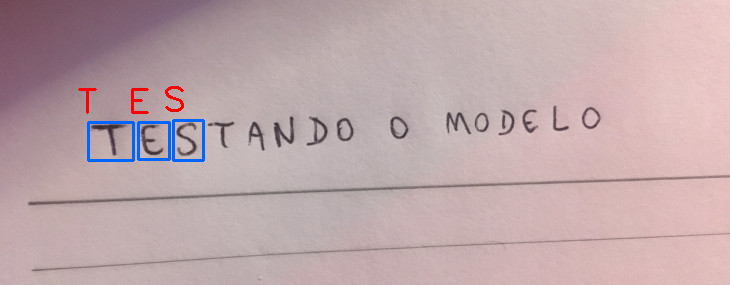

T  ->  99.97847


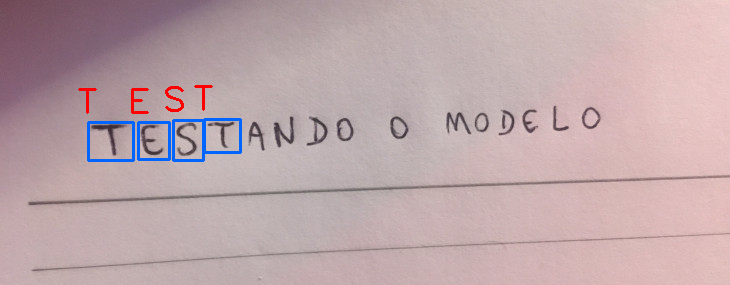

A  ->  99.899


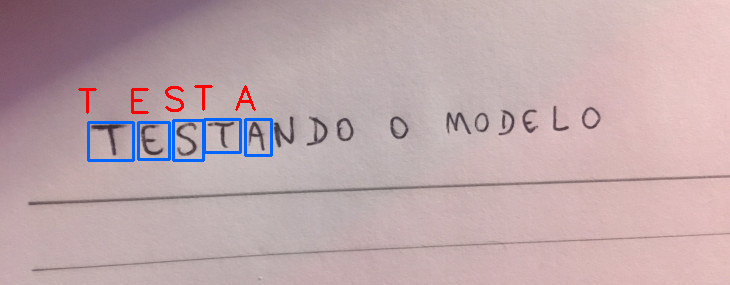

N  ->  99.79991


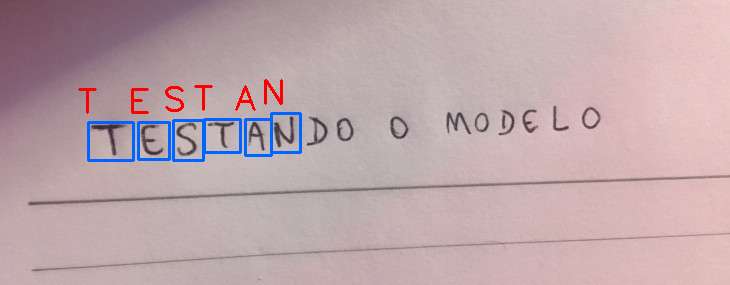

D  ->  99.99974


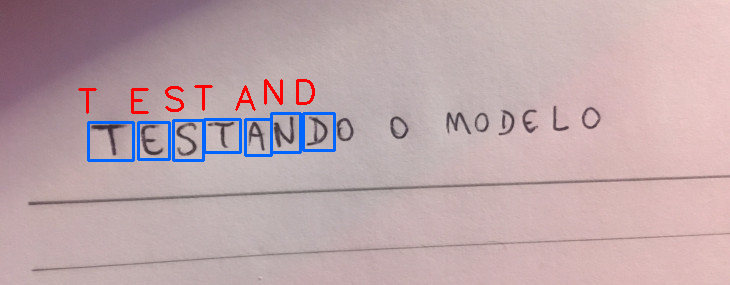

0  ->  81.893616


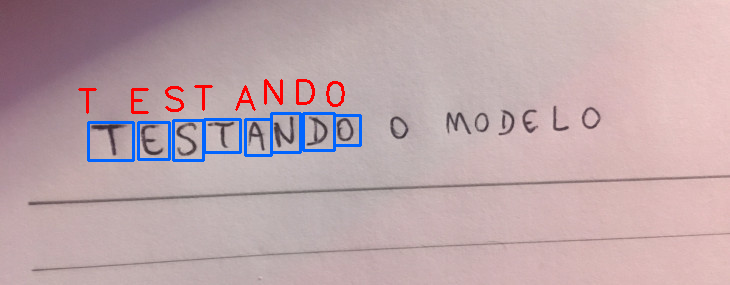

0  ->  91.187775


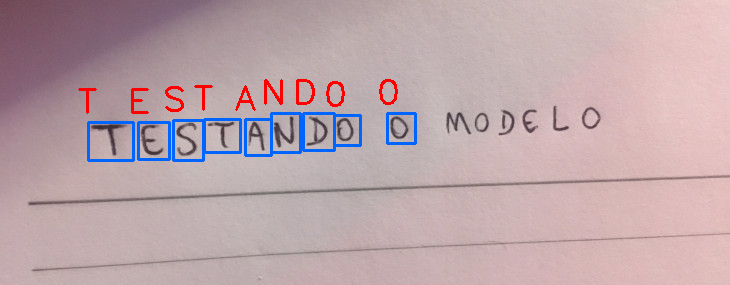

M  ->  99.71287


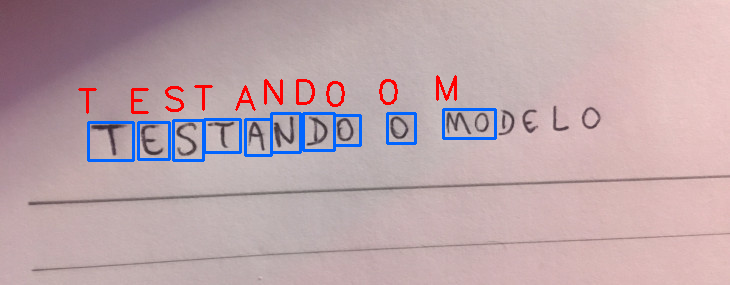

D  ->  99.96692


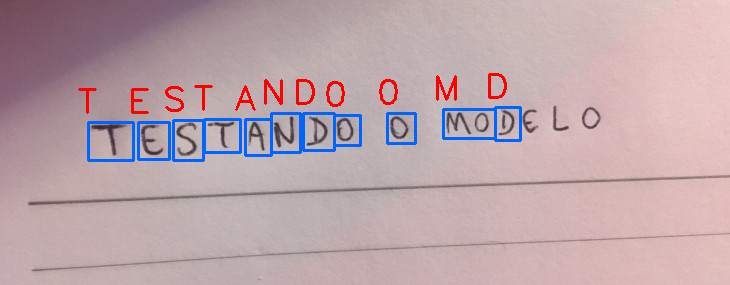

E  ->  90.748726


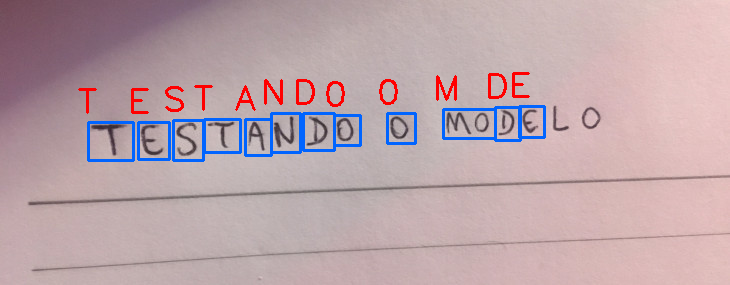

L  ->  99.984886


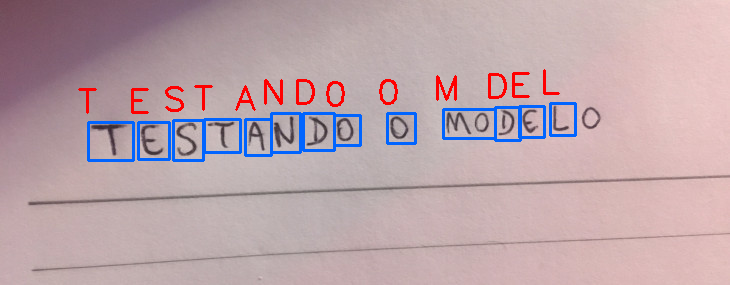

0  ->  91.78136


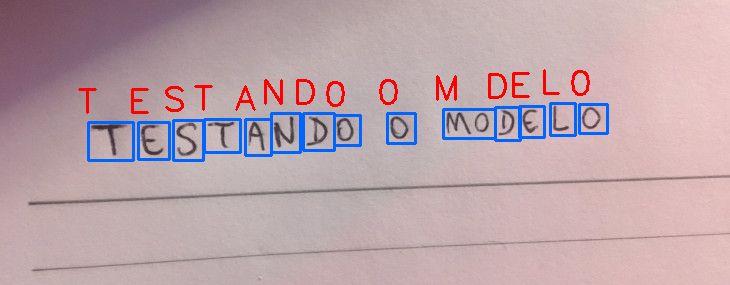

In [48]:
img_copy = img.copy()
for (prediction, (x, y, w, h)) in zip(predictions, boxes):
  i = np.argmax(prediction)
  probability = prediction[i]
  character = characters_list[i]

  cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255,100,0), 2)
  cv2.putText(img_copy, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0,0,255), 2)
  print(character, ' -> ', probability * 100)

  cv2_imshow(img_copy)

# Other tests

In [49]:
def preprocess_img(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (3, 3), 7)
  edges = cv2.Canny(blur, 40, 150)
  dilation = cv2.dilate(edges, np.ones((3,3)))
  return gray, dilation

In [50]:
def prediction(predictions, characters_list):
  i = np.argmax(predictions)
  probability = predictions[i]
  character = characters_list[i]
  return i, probability, character

In [51]:
def draw_img(img_cp, character):
  cv2.rectangle(img_cp, (x, y), (x + w, y + h), (255, 100, 0), 2)
  cv2.putText(img_cp, character, (x - 10, y - 10),cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 2)

## Problems with 0 and O, 1 an I, 5 and S

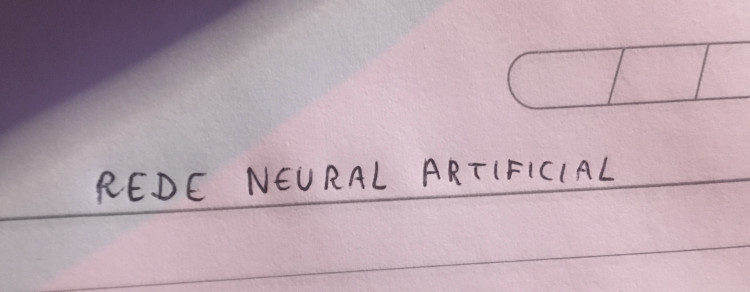

In [53]:
img = cv2.imread('/content/test_manuscript02.jpg')
cv2_imshow(img)

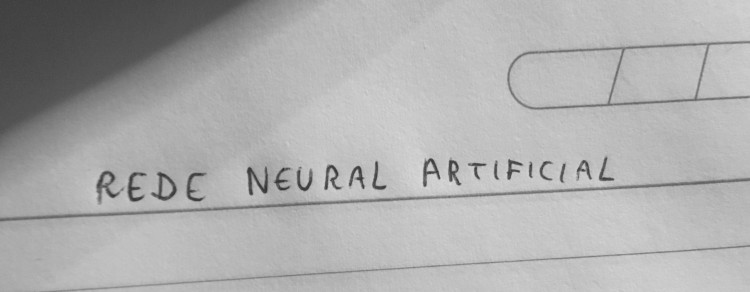

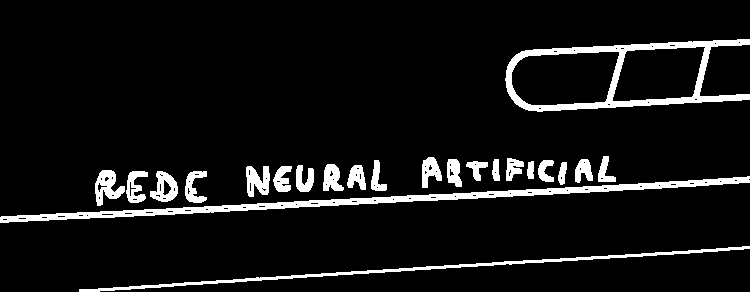

In [54]:
gray, processed_img = preprocess_img(img)
cv2_imshow(gray)
cv2_imshow(processed_img)

In [55]:
conts = find_contours(processed_img.copy())
characters = []
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype="float32")
predictions = network.predict(pixels)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


In [56]:
digits_2 = 'OI234S6789'
letters_2 = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
characters_list_2 = digits_2 + letters_2
characters_list_2 = [l for l in characters_list_2]

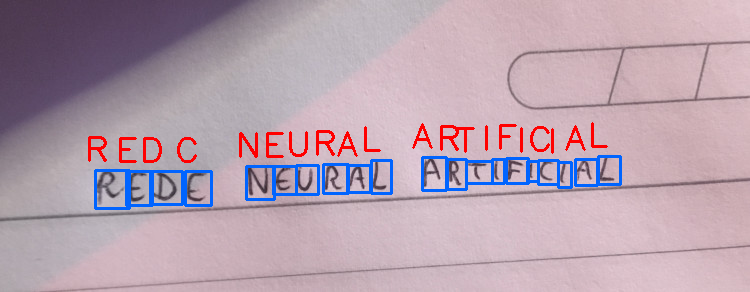

In [57]:
img_cp = img.copy()
for (pred, (x, y, w, h)) in zip(predictions, boxes):
  i, probability, character = prediction(pred, characters_list_2)
  draw_img(img_cp, character)
cv2_imshow(img_cp)

## Problems with undetected texts

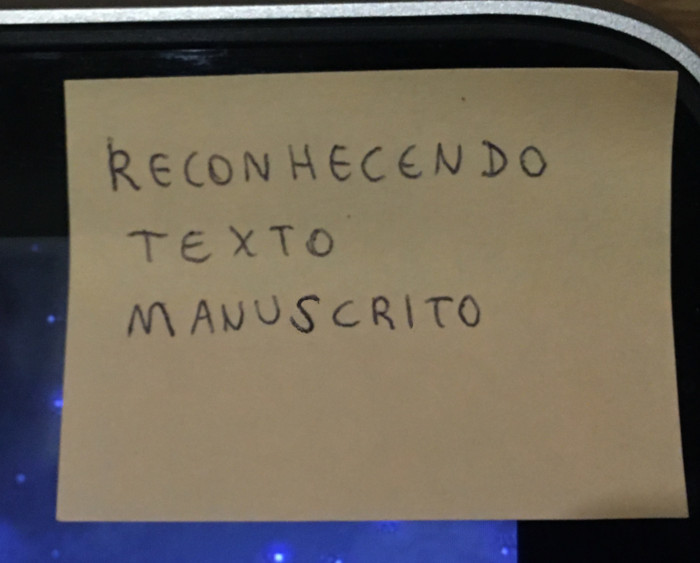

In [59]:
img = cv2.imread('/content/test_manuscript03.jpg')
cv2_imshow(img)

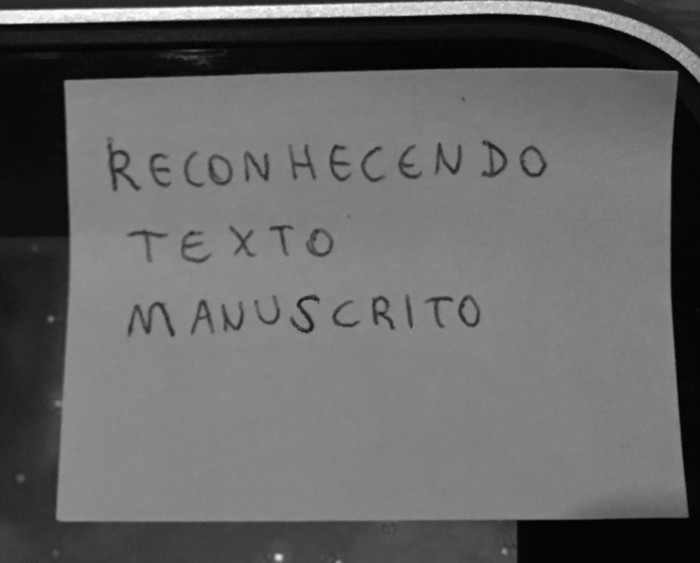

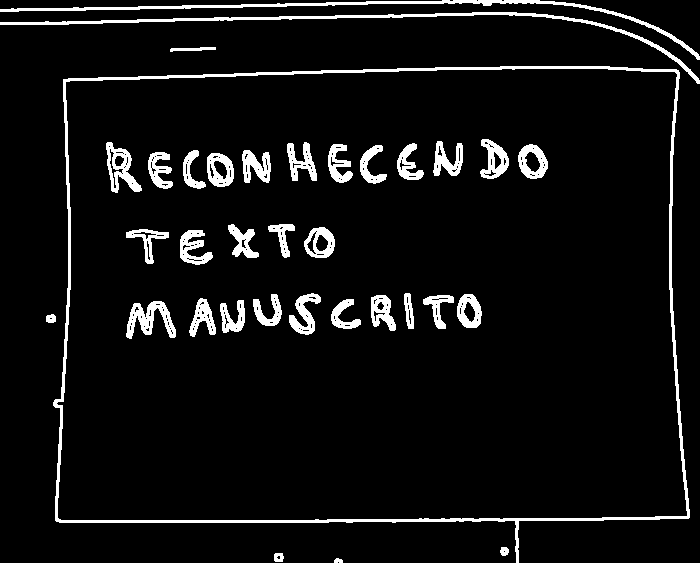

In [60]:
gray, processed_img = preprocess_img(img)
cv2_imshow(gray)
cv2_imshow(processed_img)

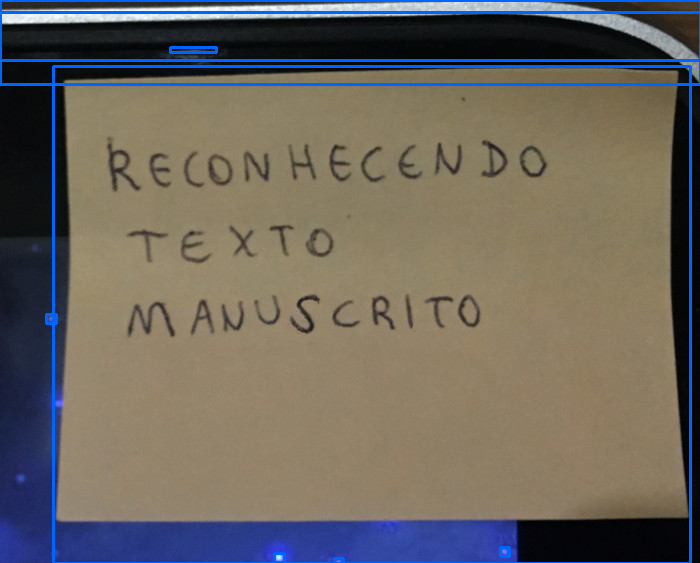

In [61]:
conts = find_contours(processed_img.copy()) # RETR_EXTERNAL
img_cp = img.copy()
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  #if (w >= l_min and w <= l_max) and (h >= a_min and h <= a_max):
  roi = gray[y:y + h, x:x + w]
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  cv2.rectangle(img_cp, (x, y), (x + w, y + h), (255, 100, 0), 2)
cv2_imshow(img_cp)

In [62]:
height, width = img.shape[:2]
print(height, width)

563 700


In [63]:
contours_size = sorted(conts, key=cv2.contourArea, reverse=True)
contours_size

[array([[[500,  66]],
 
        [[499,  67]],
 
        [[435,  67]],
 
        [[434,  68]],
 
        [[397,  68]],
 
        [[396,  69]],
 
        [[363,  69]],
 
        [[362,  70]],
 
        [[321,  70]],
 
        [[320,  71]],
 
        [[292,  71]],
 
        [[291,  72]],
 
        [[256,  72]],
 
        [[255,  73]],
 
        [[234,  73]],
 
        [[233,  74]],
 
        [[203,  74]],
 
        [[202,  75]],
 
        [[167,  75]],
 
        [[166,  76]],
 
        [[138,  76]],
 
        [[137,  77]],
 
        [[ 98,  77]],
 
        [[ 97,  78]],
 
        [[ 68,  78]],
 
        [[ 67,  79]],
 
        [[ 63,  79]],
 
        [[ 63, 101]],
 
        [[ 64, 102]],
 
        [[ 64, 122]],
 
        [[ 65, 123]],
 
        [[ 65, 156]],
 
        [[ 66, 157]],
 
        [[ 66, 184]],
 
        [[ 67, 185]],
 
        [[ 67, 208]],
 
        [[ 68, 209]],
 
        [[ 68, 287]],
 
        [[ 67, 288]],
 
        [[ 67, 304]],
 
        [[ 66, 305]],
 
        [[ 66, 3

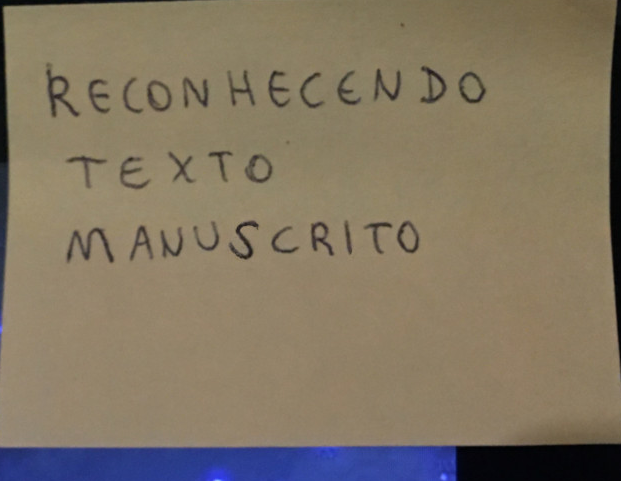

In [64]:
for c in contours_size:
  (x, y, w, h) = cv2.boundingRect(c)

  if (w >= (width / 2)) and (h >= height / 2):
    cut_off = 8
    cut_img = img[y+cut_off:y + h - cut_off, x+cut_off:x + w - cut_off]
    cv2_imshow(cut_img)

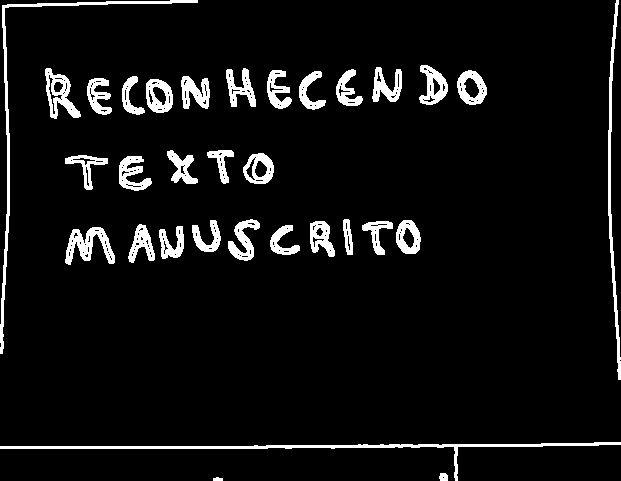

In [65]:
gray, processed_img = preprocess_img(cut_img)
cv2_imshow(processed_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


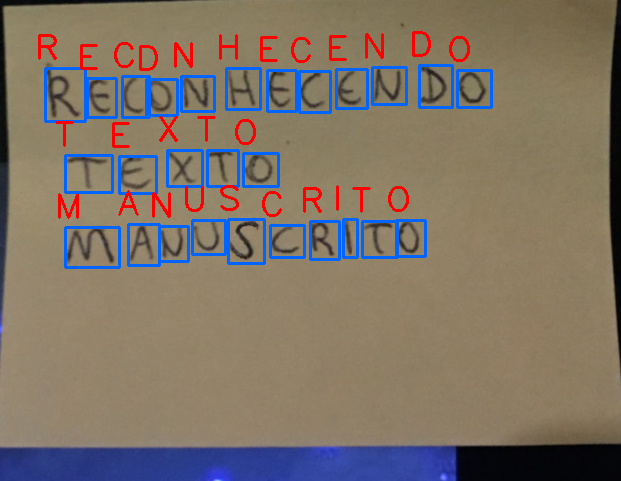

In [66]:
conts = find_contours(processed_img.copy())
characters = []
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype="float32")
predictions = network.predict(pixels)

img_cp = cut_img.copy()
for (pred, (x, y, w, h)) in zip(predictions, boxes):
  i, probability, character = prediction(pred, characters_list_2)
  draw_img(img_cp, character)
cv2_imshow(img_cp)